In [1]:
!pip install -q mediapy


In [2]:
%cd /kaggle/working/
!rm -rf /kaggle/working/Hierarchical-Localization
!git clone --quiet --recursive https://github.com/cvg/Hierarchical-Localization/
%cd /kaggle/working/Hierarchical-Localization
!pip install -e .

from hloc import extract_features, match_features, reconstruction, visualization, pairs_from_exhaustive
from hloc.visualization import plot_images, read_image
from hloc.utils import viz_3d

%cd /kaggle/working/

/kaggle/working
/kaggle/working/Hierarchical-Localization
Obtaining file:///kaggle/working/Hierarchical-Localization
  Preparing metadata (setup.py) ... done
  Cloning https://github.com/cvg/LightGlue to /tmp/pip-install-od6ck5f3/lightglue_a24106c178f94377bfc58cf0eaed24cf
  Running command git clone --filter=blob:none --quiet https://github.com/cvg/LightGlue /tmp/pip-install-od6ck5f3/lightglue_a24106c178f94377bfc58cf0eaed24cf
  Resolved https://github.com/cvg/LightGlue to commit edb2b838efb2ecfe3f88097c5fad9887d95aedad
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 12.5/12.5 MB 82.9 MB/s eta 0:00:00
  Created wheel for lightglue: filename=lightglue-0.0-py3-none-any.whl size=39542 sha256=15c49de6348a9784d7dca79cec8dd53a8a89f9686720d0876122a116b13d540a
  Stored in directory: /tmp/pip-ephem-wheel-cache-usx_3xxo/wheels/30/34/06/6b38022b3f1bd6489c3cd65367c6a4dd

In [3]:
from pathlib import Path

import cv2
import mediapy
import pandas as pd
import plotly.express as px
import pycolmap
import os
import random
from PIL import Image
import matplotlib.pyplot as plt

In [4]:
train_labels = pd.read_csv("/kaggle/input/image-matching-challenge-2025/train_labels.csv")
train_labels

,dataset,scene,image,rotation_matrix,translation_vector
0,imc2023_haiper,fountain,fountain_image_116.png,0.122655949;0.947713775;-0.294608417;0.1226706...,0.093771314;-0.803560988;2.062001533
1,imc2023_haiper,fountain,fountain_image_108.png,0.474305910;0.359108654;-0.803787832;0.2888416...,0.358946647;-0.797557548;1.910906929
2,imc2023_haiper,fountain,fountain_image_101.png,0.565115476;-0.138485064;-0.813305838;0.506678...,0.146922468;-0.981392596;2.009002852
3,imc2023_haiper,fountain,fountain_image_082.png,-0.308320392;-0.794654112;0.522937261;0.948141...,0.206413831;-1.174321103;3.667167680
4,imc2023_haiper,fountain,fountain_image_071.png,-0.569002830;-0.103808175;0.815757098;0.778745...,-0.015140892;-1.334052012;3.488936597
...,...,...,...,...,...
1940,stairs,stairs_split_2,stairs_split_2_1710453733751.png,0.961762441;-0.187990401;0.199179859;-0.177691...,-0.112850000;-3.521750000;-2.859750000
1941,stairs,stairs_split_2,stairs_split_2_1710453759963.png,0.237960308;0.580896704;-0.778417569;0.4077886...,-0.490768000;-3.064140000;3.008420000
1942,stairs,stairs_split_2,stairs_split_2_1710453805788.png,0.309067298;0.541767194;-0.781642957;0.4038963...,-0.572757000;0.885835000;4.987270000
1943,stairs,stairs_split_2,stairs_split_2_1710453765165.png,0.301920210;0.609614467;-0.732949103;0.5007116...,-0.135613000;-1.832910000;1.598790000


In [5]:
train_labels.groupby("dataset")["scene"].nunique()


dataset
ETs                                  3
amy_gardens                          1
fbk_vineyard                         3
imc2023_haiper                       3
imc2023_heritage                     4
imc2023_theather_imc2024_church      2
imc2024_dioscuri_baalshamin          3
imc2024_lizard_pond                  3
pt_brandenburg_british_buckingham    3
pt_piazzasanmarco_grandplace         2
pt_sacrecoeur_trevi_tajmahal         3
pt_stpeters_stpauls                  2
stairs                               2
Name: scene, dtype: int64

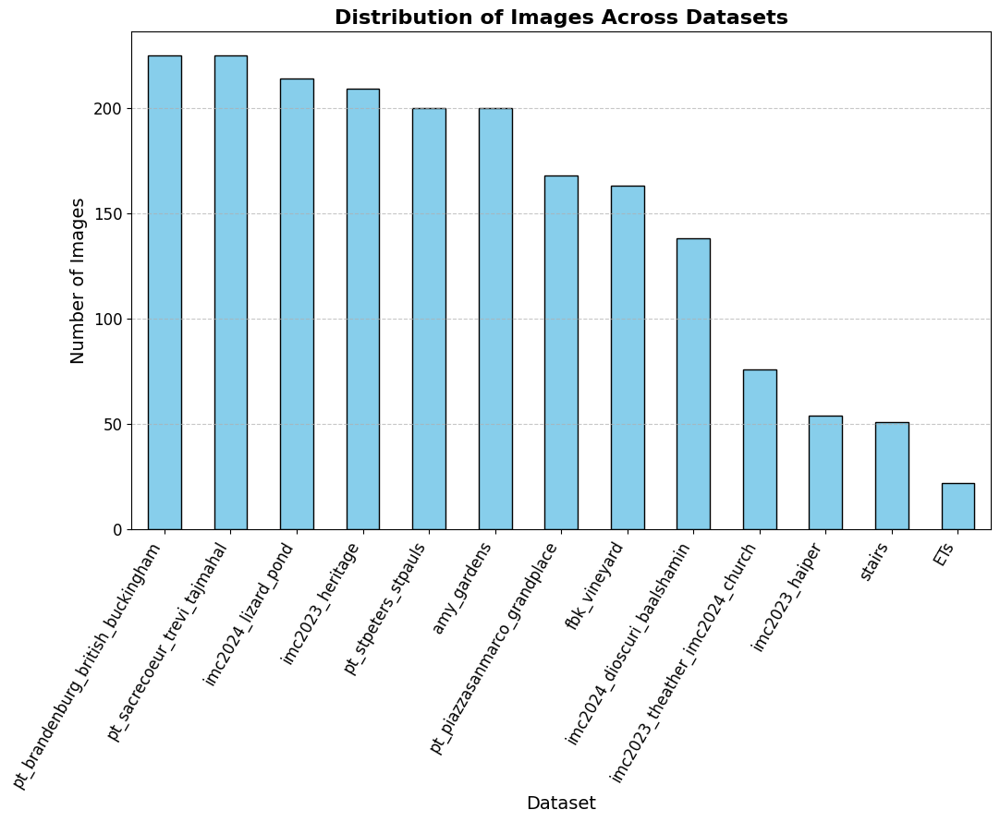

In [6]:
dataset_counts = train_labels["dataset"].value_counts()

plt.figure(figsize=(12, 7))
dataset_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('Distribution of Images Across Datasets', fontsize=16, fontweight='bold')
plt.xlabel('Dataset', fontsize=14)
plt.ylabel('Number of Images', fontsize=14)
plt.xticks(rotation=60, ha='right', fontsize=12)  
plt.yticks(fontsize=12)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [7]:
def plot_random_images(scene_name, base_path="/kaggle/input/image-matching-challenge-2025/train"):
    scene_path = os.path.join(base_path, scene_name)
    image_filenames = [f for f in os.listdir(scene_path) if f.endswith(('.png', '.jpg', '.jpeg'))]
    random_images = random.sample(image_filenames, min(5, len(image_filenames)))
    fig, axes = plt.subplots(1, len(random_images), figsize=(15, 5))
    if len(random_images) == 1:
        axes = [axes]

    for ax, img_filename in zip(axes, random_images):
        img_path = os.path.join(scene_path, img_filename)
        img = Image.open(img_path)
        ax.imshow(img)
        ax.set_title(img_filename, fontsize=10)
        ax.axis('off')
    plt.tight_layout()
    plt.show()

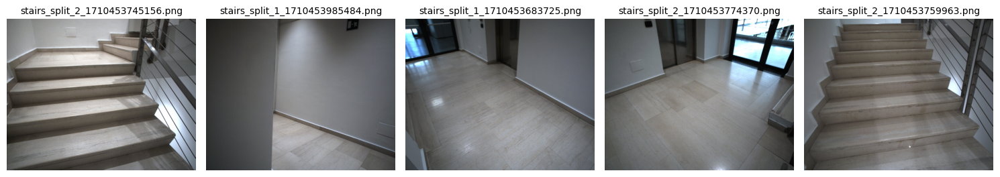

In [8]:
plot_random_images("stairs")


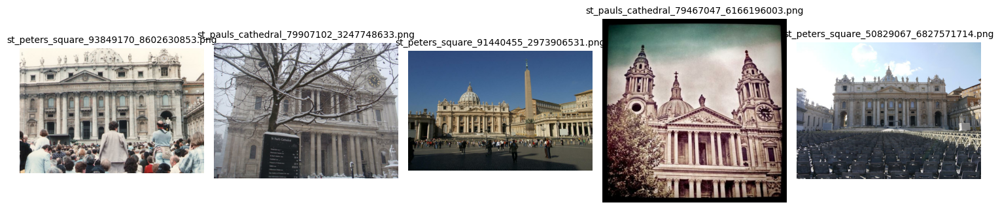

In [9]:
plot_random_images("pt_stpeters_stpauls")


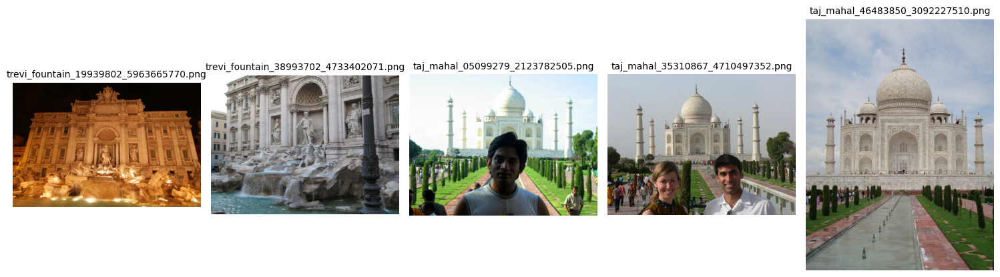

In [10]:
plot_random_images("pt_sacrecoeur_trevi_tajmahal")


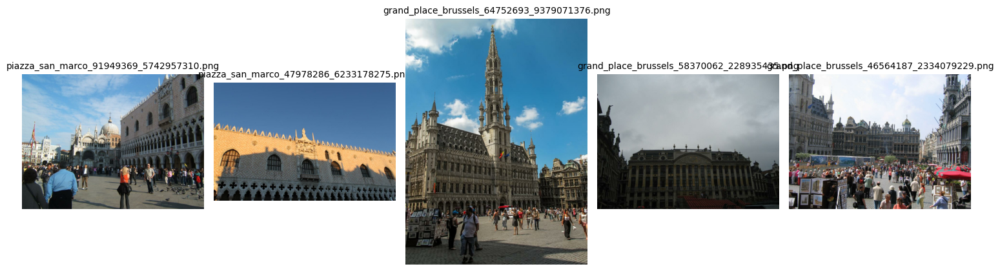

In [11]:
plot_random_images("pt_piazzasanmarco_grandplace")


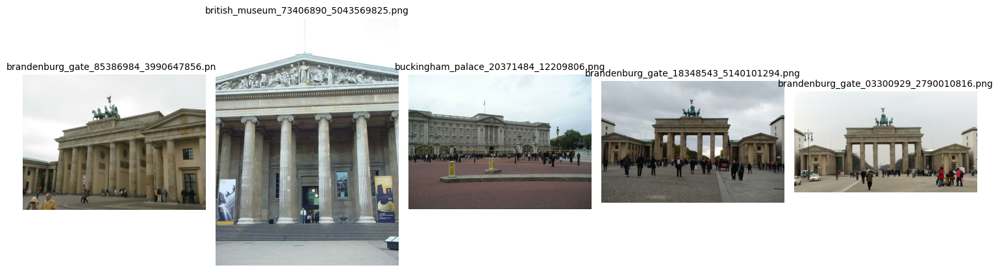

In [12]:
plot_random_images("pt_brandenburg_british_buckingham")


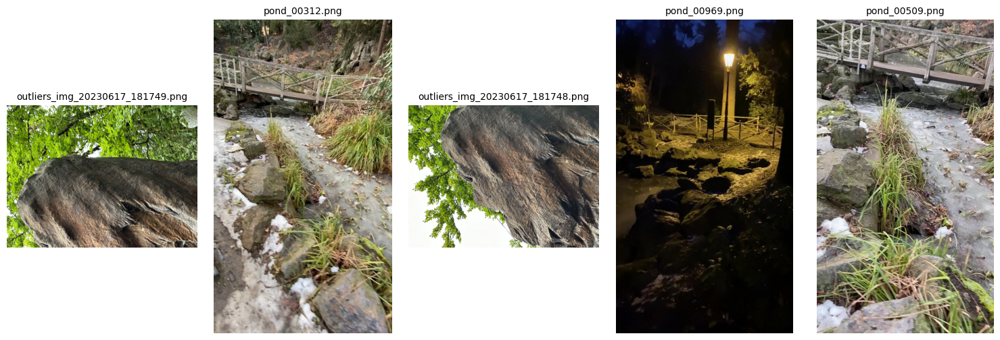

In [13]:
plot_random_images("imc2024_lizard_pond")


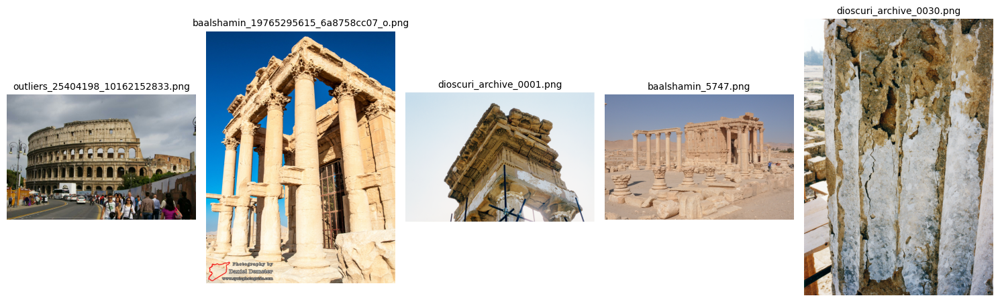

In [14]:
plot_random_images("imc2024_dioscuri_baalshamin")


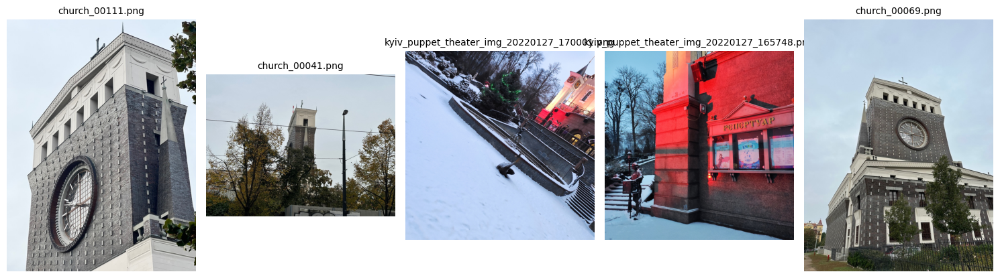

In [15]:
plot_random_images("imc2023_theather_imc2024_church")


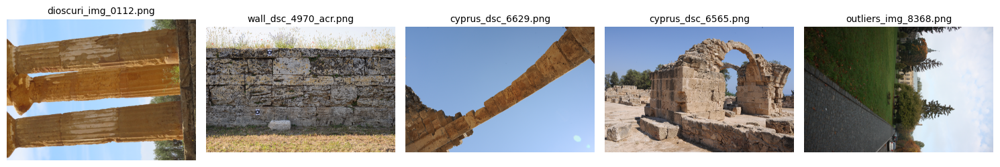

In [16]:
plot_random_images("imc2023_heritage")


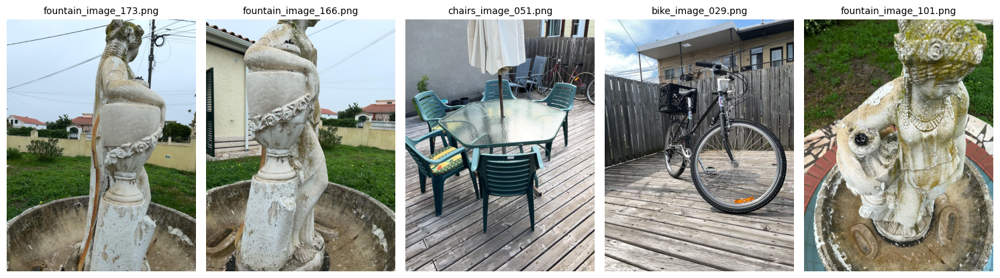

In [17]:
plot_random_images("imc2023_haiper")


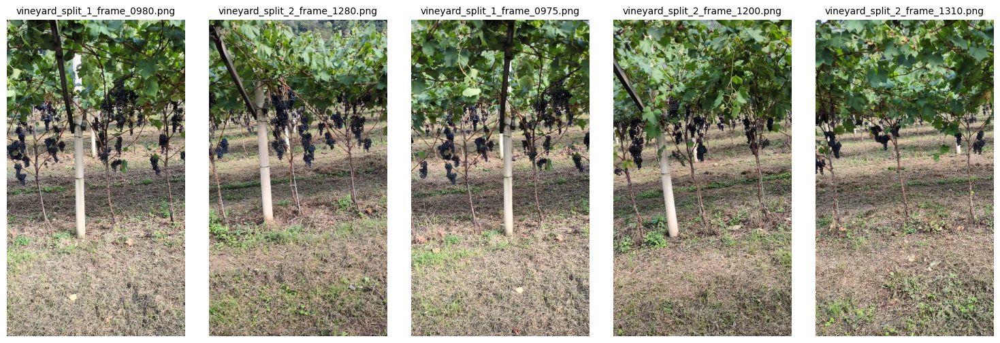

In [18]:
plot_random_images("fbk_vineyard")


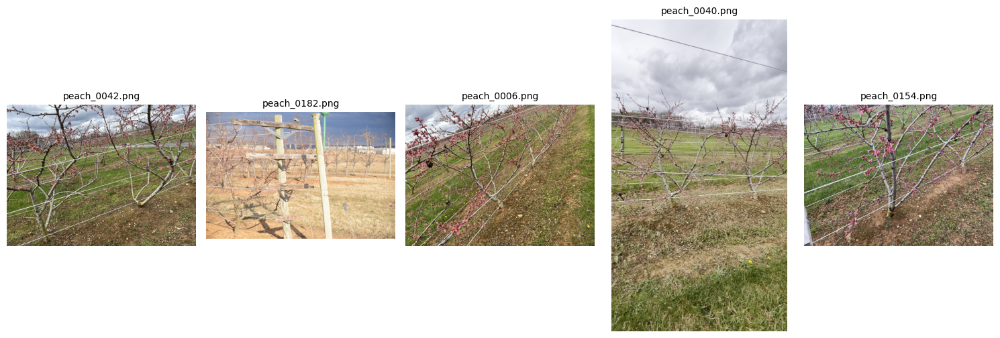

In [19]:
plot_random_images("amy_gardens")


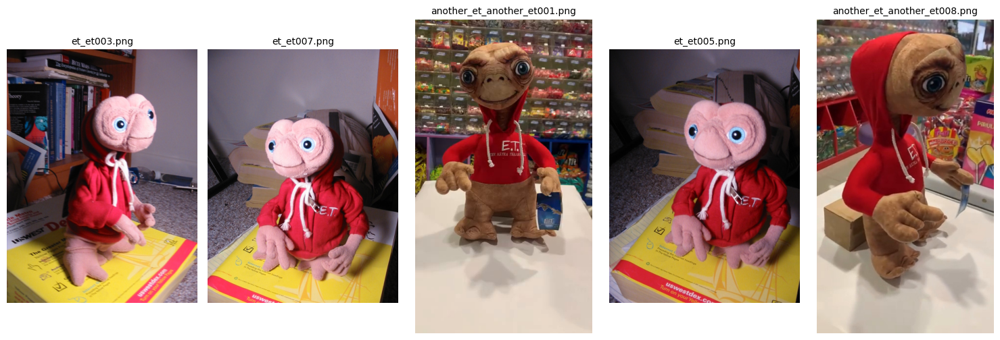

In [20]:
plot_random_images("ETs")
